# Детекция автотранспорта

# Введение

## Описательная часть

## Тема: Детекция автотранспорта.

## Цель: Создание работающего сайта, который находит машины на аэрофотоснимках

В этом проекте мы сможем попробовать себя в роле ML Engineer. Мы бкдем самостоятельно выбирать модель и архитектуру.

А в конце реализуем MVP версию нашего ML приложения.

## Задачи

1. Обучить модель
2. Реализовать WEB приложение
3. Презентовать свое решение.

## Инструменты:  

ultralytics (YOLO), FastAPI и Streamlit

## Датасеты:

- https://www.kaggle.com/datasets/kushagrapandya/visdrone-dataset
- https://storage.googleapis.com/openimages/web/download_v7.html

## Критерий оценки:

В работе мы будем оценивать `mAP` (mean Average Precision), потому что метрика сразу учитывает полноту и точность детекции.

## Датасеты:

### VisDrone Dataset
- Специально создан для задач компьютерного зрения с БПЛА.
- Содержит 261 908 кадров и 10 209 статичных изображений, размеченных более чем 2.6 миллионами рамок.
- Включает 10 классов, среди которых `car` (автомобиль), `van`, `truck`, `bus`.
- Общий объем данных составляет 2.3 ГБ.

### Open Images V7
- Содержит около 1.9 миллионов изображений
- Аннотации включают автомобили
- Намного больше и сложнее для начальной обработки, чем VisDrone.
 ---
 Для начала мы будем работать с `VisDrone`. Он уже подготовлен для работы с YOLO, имеет оптимальный размер и напрямую решает задачу детекции транспорта с высоты.

`Open Images V7` может пригодиться на следующем этапе для дообучения модели и повышения ее точности за счет большего разнообразия данных.

## Примерный план работы

---

**1. Подготовка модели.**
- Работа с данными. Выбираем и скачиваем датасет.
- Настройка модели. Берем YOLO из ultralytics, настраиваем её (fine-tune) так, чтобы она детектировала все нужные классы транспорта. В рамках реализации MVP системы детекции автотранспорта предполагается стратегия разработки двух независимых моделей.
- Сохранение лучших весов модели.

---

**2. Создание ядра приложения.**
- Пишем срипт, который загружает лучшие веса модели и выполняет детекцию на новом изображении, возвращая картинку с боксами.
- Пишем простое API на FastAPI, чтобы к этому ядру можно было обращаться по сети.

---

**3. Создание интерфейса и деплой.**
- Пишем интерфейс на Streamlit с загрузкой файла и кнопкой.
- Создаем интерфейс с нашим API: загруженная картинка уходит в API, API вызывает скрипт, возвращает обработанную картинку, Streamlit её показывает.

---

**Дополнительно:**
- Выкладываем всё на GitHub и пробуем задеплоить на Streamlit Cloud.

# Подготовка модели

## Работа с данными

#### Загрузка библиотек

In [ ]:
#!rm -rf *

In [ ]:
# !pip install ultralytics

In [ ]:
# !pip install -U sahi ultralytics

In [ ]:
# !pip install fastapi uvicorn python-multipart pyngrok

In [ ]:
import pandas as pd
import numpy as np
import kagglehub
import os
import cv2
import matplotlib.pyplot as plt
import shutil
import random
import glob
import yaml
import time
import collections

import torch, torchvision

import nest_asyncio
import uvicorn
import asyncio

from PIL import Image, ImageDraw, ImageFont
from google.colab import files
from google.colab.patches import cv2_imshow
from collections import defaultdict, Counter
from pathlib import Path
from matplotlib import pyplot as plt
from PIL import Image
from tqdm import tqdm

from ultralytics import YOLO
from ultralytics.data.utils import check_det_dataset
from torch.utils.data import WeightedRandomSampler
from torchvision import transforms
from torchvision.utils import draw_bounding_boxes, draw_segmentation_masks
from ultralytics.utils.downloads import download
from ultralytics.utils import ops

from pyngrok import ngrok

from fastapi import FastAPI, File, UploadFile, Query
from fastapi.responses import Response


#### Загрузка данных, конвертация, отбор классов

In [ ]:
# Скачиваем
raw_path = kagglehub.dataset_download("kushagrapandya/visdrone-dataset")
raw_path = Path(raw_path)

# оздаем структуру в /content
dest_root = Path("/content/motor_dataset")
if dest_root.exists():
    shutil.rmtree(dest_root)

splits = {'train': 'train', 'val': 'val', 'test': 'test-dev'}

for folder in splits.keys():
    (dest_root / folder / 'images').mkdir(parents=True, exist_ok=True)
    (dest_root / folder / 'labels').mkdir(parents=True, exist_ok=True)

# Двойные папки
def link_visdrone_images(src_base, dest_base):
    for dest_name, src_suffix in splits.items():
        folder_name = f"VisDrone2019-DET-{src_suffix}"

        variants = [
            src_base / folder_name / folder_name / 'images',
            src_base / folder_name / 'images'
        ]

        img_src_dir = None
        for v in variants:
            if v.exists():
                img_src_dir = v
                break

        if img_src_dir:
            print(f"Привязка {dest_name}: {img_src_dir.relative_to(src_base)}")
            for img in img_src_dir.glob('*.jpg'):
                target = dest_base / dest_name / 'images' / img.name
                if not target.exists():
                    os.symlink(img, target)
        else:
            print(f"Не удалось найти картинки для {src_suffix}")

# Запускаем
link_visdrone_images(raw_path, dest_root)

print(f"Train: {len(os.listdir(dest_root/'train/images'))}")
print(f"Val: {len(os.listdir(dest_root/'val/images'))}")
print(f"Test: {len(os.listdir(dest_root/'test/images'))}")

100%|██████████| 2.10G/2.10G [00:26<00:00, 86.4MB/s]

Extracting files...


Привязка train: VisDrone2019-DET-train/VisDrone2019-DET-train/images
Привязка val: VisDrone2019-DET-val/VisDrone2019-DET-val/images
Привязка test: VisDrone2019-DET-test-dev/VisDrone2019-DET-test-dev/images
Train: 6471
Val: 548
Test: 1610


In [ ]:
# Конвертация
def convert_annotations(src_base, dest_root):

    # 4:car, 5:van, 6:truck, 7:tricycle, 8:awning-tricycle, 9:bus, 10:motor
    mapping = {4: 0, 5: 1, 6: 2, 7: 3, 8: 4, 9: 5, 10: 6}

    splits = {'train': 'train', 'val': 'val', 'test': 'test-dev'}

    for dest_name, src_suffix in splits.items():
        folder_name = f"VisDrone2019-DET-{src_suffix}"
        # Двойственная вложенность для аннотаций
        src_anno_dir = src_base / folder_name / folder_name / 'annotations'
        src_img_dir = src_base / folder_name / folder_name / 'images'

        dest_label_dir = Path(dest_root) / dest_name / 'labels'

        print(f"Обработка аннотаций для {dest_name}...")

        for anno_file in tqdm(list(src_anno_dir.glob('*.txt'))):

            img_path = src_img_dir / f"{anno_file.stem}.jpg"
            if not img_path.exists():
                continue

            with Image.open(img_path) as img:
                width, height = img.size

            dw = 1. / width
            dh = 1. / height

            yolo_lines = []
            with open(anno_file, 'r') as f:
                for line in f:
                    parts = line.strip().split(',')
                    if len(parts) < 8: continue

                    vis_cls = int(parts[5])

                    if vis_cls in mapping:
                        new_cls = mapping[vis_cls]

                        # Координаты VisDrone: левый верхний угол, ширина, высота
                        x, y, w, h = map(float, parts[:4])

                        # Пересчитываем в YOLO: центр_x, центр_y, ширина, высота (нормализованные)
                        x_center = (x + w / 2) * dw
                        y_center = (y + h / 2) * dh
                        w_norm = w * dw
                        h_norm = h * dh

                        yolo_lines.append(f"{new_cls} {x_center:.6f} {y_center:.6f} {w_norm:.6f} {h_norm:.6f}")

            # Сохраняем файл, только если в нем есть нужные нам объекты
            if yolo_lines:
                with open(dest_label_dir / anno_file.name, 'w') as f:
                    f.write('\n'.join(yolo_lines))

# Запускаем
convert_annotations(raw_path, '/content/motor_dataset')

print("Done")

Обработка аннотаций для train...


100%|██████████| 6471/6471 [00:04<00:00, 1588.45it/s]


Обработка аннотаций для val...


100%|██████████| 548/548 [00:00<00:00, 1459.36it/s]


Обработка аннотаций для test...


100%|██████████| 1610/1610 [00:01<00:00, 1515.30it/s]

Done


In [ ]:
# Yaml-file
config = {
    'path': '/content/motor_dataset',
    'train': 'train/images',
    'val': 'val/images',
    'test': 'test/images',
    'nc': 7,
    'names': ['car', 'van', 'truck', 'tricycle', 'awning-tricycle', 'bus', 'motor']
}

with open('/content/motor_dataset/data.yaml', 'w') as f:
    yaml.dump(config, f)

print('Done')

Done


#### Знакомство с данными

In [ ]:
# Посмотрим на пример аннотации
labels_path = '/content/motor_dataset/train/labels'
sample_files = os.listdir(labels_path)

if sample_files:
    sample_file = sample_files[0]
    #print(f"Содержимое файла {sample_file}")
    #with open(os.path.join(labels_path, sample_file), 'r') as f:
        #print(f.read())
else:
    print("Папка с лейблами пуста!")

# Посчитаем распределение классов для проверки маппинга
class_counts = {i: 0 for i in range(7)}
for label_file in os.listdir(labels_path):
    with open(os.path.join(labels_path, label_file), 'r') as f:
        for line in f:
            cls = int(line.split()[0])
            class_counts[cls] += 1

print("Распределение объектов по классам")
names = ['car', 'van', 'truck', 'tricycle', 'awning-tricycle', 'bus', 'motor']
for i, count in class_counts.items():
    print(f"{i} ({names[i]}): {count} объектов")

Распределение объектов по классам
0 (car): 144867 объектов
1 (van): 24956 объектов
2 (truck): 12875 объектов
3 (tricycle): 4812 объектов
4 (awning-tricycle): 3246 объектов
5 (bus): 5926 объектов
6 (motor): 29647 объектов


In [ ]:
# Проверим соответствие файла в images файлу в annotations
# Пути к оригиналу

raw_path = Path(raw_path)

train_images_path = raw_path / 'VisDrone2019-DET-train' / 'VisDrone2019-DET-train' / 'images'
train_annos_path = raw_path / 'VisDrone2019-DET-train' / 'VisDrone2019-DET-train' / 'annotations'

# Проверка имен
if train_images_path.exists():
    all_images = sorted(os.listdir(train_images_path))
    first_image_name = all_images[0]
    first_anno_name = first_image_name.replace('.jpg', '.txt')

    print(f"Путь (raw_path): {raw_path}")
    print(f"Имя в images:      {first_image_name}")
    print(f"Имя в annotations: {first_anno_name}")

    # Проверим, существует ли такой файл физически
    if (train_annos_path / first_anno_name).exists():
        print("!")
    else:
        print("Файл аннотации не найден!")

Путь (raw_path): /kaggle/input/visdrone-dataset
Имя в images:      0000002_00005_d_0000014.jpg
Имя в annotations: 0000002_00005_d_0000014.txt
!


In [ ]:
# Размеры изображений
sizes = []
count = 0
for img_path in raw_path.rglob('*.jpg'):
    if count >= 50:
        break
    with Image.open(img_path) as img:
        sizes.append(img.size)
    count += 1

print(f"Проверено {len(sizes)} изображений")
print(f"Уникальные размеры: {set(sizes)}")

Проверено 50 изображений
Уникальные размеры: {(1400, 788), (1360, 765), (960, 540), (1916, 1078), (1400, 1050)}


In [ ]:
object_widths = []
object_heights = []

count = 0

train_img_dir = raw_path / 'VisDrone2019-DET-train' / 'VisDrone2019-DET-train' / 'images'

for img_path in train_img_dir.glob('*.jpg'):
    if count >= 100: break

    anno_path = img_path.parent.parent / 'annotations' / f"{img_path.stem}.txt"

    if anno_path.exists():
        with Image.open(img_path) as img:
            img_w, img_h = img.size

        with open(anno_path, 'r') as f:
            for line in f:
                parts = line.strip().split(',')
                if len(parts) < 8: continue

                vis_cls = int(parts[5])
                # Проверяем моторные классы (4-10)
                if 4 <= vis_cls <= 10:
                    w_px = float(parts[2])
                    h_px = float(parts[3])
                    object_widths.append(w_px)
                    object_heights.append(h_px)
        count += 1

if len(object_widths) > 0:
    print(f"Проанализировано изображений: {count}")
    print(f"Всего объектов найдено: {len(object_widths)}")
    print(f"Средняя ширина объекта: {np.mean(object_widths):.1f} px")
    print(f"Средняя высота объекта: {np.mean(object_heights):.1f} px")
    print(f"Минимальная ширина: {np.min(object_widths):.1f} px")
    print(f"Максимальная ширина: {np.max(object_widths):.1f} px")
else:
    print("Объекты всё еще не найдены. Проверь путь:", anno_path)

Проанализировано изображений: 100
Всего объектов найдено: 3987
Средняя ширина объекта: 49.2 px
Средняя высота объекта: 40.5 px
Минимальная ширина: 3.0 px
Максимальная ширина: 364.0 px


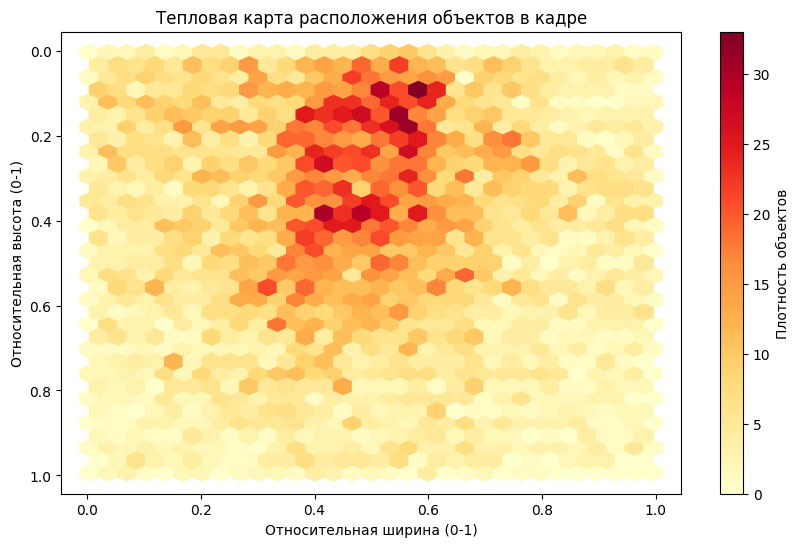

In [ ]:
# Построим тепловую карту центров всех наших 3922 объектов,
# чтобы понять, как они распределены по кадру.
x_centers = []
y_centers = []

count = 0
train_img_dir = raw_path / 'VisDrone2019-DET-train' / 'VisDrone2019-DET-train' / 'images'

for img_path in train_img_dir.glob('*.jpg'):
    if count >= 200: break

    anno_path = img_path.parent.parent / 'annotations' / f"{img_path.stem}.txt"
    if anno_path.exists():
        with Image.open(img_path) as img:
            img_w, img_h = img.size

        with open(anno_path, 'r') as f:
            for line in f:
                parts = line.strip().split(',')
                if len(parts) < 8 or not (4 <= int(parts[5]) <= 10): continue

                # Координаты VisDrone: x, y, w, h (в пикселях)
                x = float(parts[0])
                y = float(parts[1])
                w = float(parts[2])
                h = float(parts[3])

                # Находим центр и нормализуем
                x_centers.append((x + w/2) / img_w)
                y_centers.append((y + h/2) / img_h)
        count += 1

# Строим график
plt.figure(figsize=(10, 6))
plt.hexbin(x_centers, y_centers, gridsize=30, cmap='YlOrRd')
plt.colorbar(label='Плотность объектов')
plt.title('Тепловая карта расположения объектов в кадре')
plt.xlabel('Относительная ширина (0-1)')
plt.ylabel('Относительная высота (0-1)')
plt.gca().invert_yaxis()
plt.show()

#### Визуализация

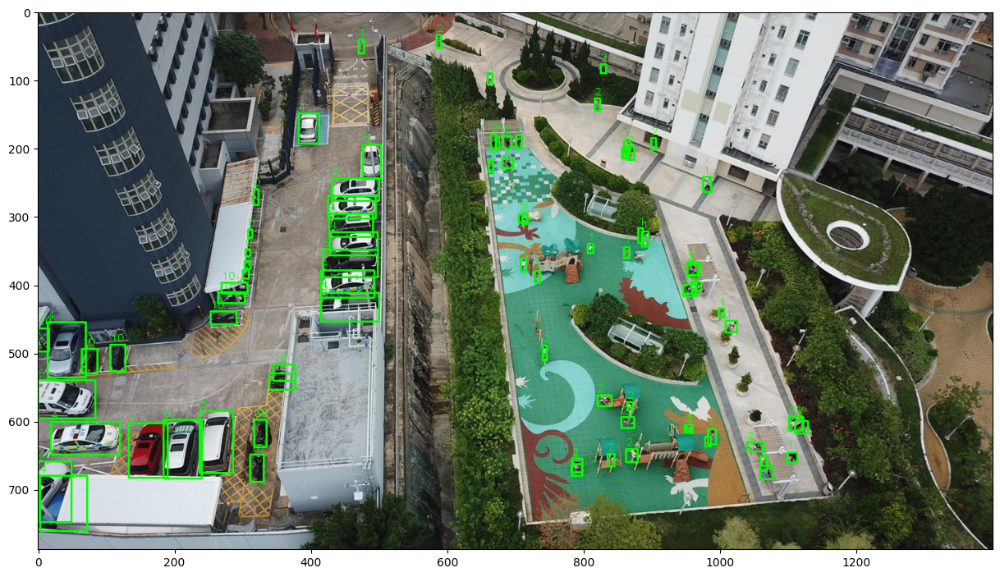

In [ ]:
# Визуализируем
img_path = train_images_path / '9999955_00000_d_0000257.jpg'
anno_path = img_path.parent.parent / 'annotations' / (img_path.stem + '.txt')

img = cv2.imread(str(img_path))

with open(anno_path) as f:
    for line in f:
        x, y, w, h, _, cls, _, _ = line.split(',')
        x, y, w, h = int(x), int(y), int(w), int(h)

        cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)
        cv2.putText(img, cls, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

fig = plt.figure(figsize=(15, 10))
plt.imshow(img_rgb)
plt.show()

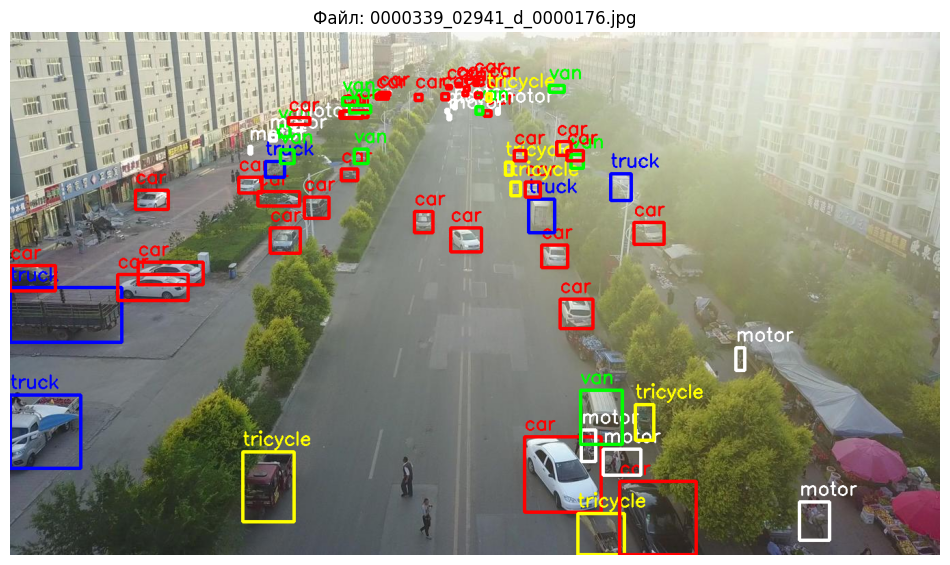

In [ ]:
def plot_random_samples(dataset_path, num_samples=1):
    names = ['car', 'van', 'truck', 'tricycle', 'awning-tricycle', 'bus', 'motor']

    colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0), (255, 0, 255), (0, 255, 255), (255, 255, 255)]

    img_dir = Path(dataset_path) / 'train' / 'images'
    lbl_dir = Path(dataset_path) / 'train' / 'labels'
    img_files = list(img_dir.glob('*.jpg'))

    selected_imgs = random.sample(img_files, num_samples)

    for img_path in selected_imgs:
        img = cv2.imread(str(img_path))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w, _ = img.shape

        label_path = lbl_dir / f"{img_path.stem}.txt"
        if label_path.exists():
            with open(label_path, 'r') as f:
                for line in f:
                    cls, xc, yc, wn, hn = map(float, line.split())

                    x1 = int((xc - wn/2) * w)
                    y1 = int((yc - hn/2) * h)
                    x2 = int((xc + wn/2) * w)
                    y2 = int((yc + hn/2) * h)

                    cv2.rectangle(img, (x1, y1), (x2, y2), colors[int(cls)], 3)
                    cv2.putText(img, names[int(cls)], (x1, y1 - 10),
                                cv2.FONT_HERSHEY_SIMPLEX, 0.9, colors[int(cls)], 2)

        plt.figure(figsize=(12, 8))
        plt.imshow(img)
        plt.title(f"Файл: {img_path.name}")
        plt.axis('off')
        plt.show()

plot_random_samples('/content/motor_dataset')

#### Выводы


- Данные успешно загружены и конвертированы для YOLO
- Выделено 7 категорий транспорта (car, van, truck, tricycle, awning-tricycle, bus, motor).
- Обработано более 6 000 кадров высокого разрешения.
- Подтверждено соответствие между изображениями и файлами аннотаций в формате YOLO.

**Особенности данных**

- В обучающей выборке более 6 тыс изображений и более 340 тыс объектов
- Большая вариативность масштаба, средний размер bounding box показывает, что мы будем работать с маленькими изображениями
- Минимальный размер 3 пикселя
- Датасет содержит разноразмерные изображения с разным соотношением сторон
- Большинство объектов сосредоточено вдоль осевых линий дорог в центре кадра
- Данные представлены в смешанном разрешении (от 1360px до 1920px)
- Дисбаланс классов: разрыв в количестве объектов достигает 45 раз.
- Класс car (машина) представлен активнее всего





## Настройка модели

#### Ньюансы в изображениях








Используемый нами датасет сделан с помощью дронов.

**Особенности снимков с дронов**, которые влияют на обучение модели:

**Изображения**
- Объекты мелкие, один кадр содержит десятки объектов
- Съёмка под углом, виден горизонт на многих кадрах

**Разнообразие условий**

- Разное освещение, которое зависит от разных погодных условий
- Разная высота полёта, изменяющиеся ракурсы и объекты в движении

**Особенности**
- Шум, размытие, разные настройки камер

#### Примерный план работы


**Ход обучения:**

- Сначала будем учить модели на исходных данных без изменений.

- Потом попробуем разнообразить данные искусственно, чтобы модель стала устойчивее.

- Затем попробуем улучшить детекцию мелких объектов (уменьшить размер, чтобы сохранить детали мелких машин).

- В итоге мы планируем скомбинировать лучшие варианты.

**Примерные параметры обучения:**

- Увеличение входного размера до **960px** (вместо стандартных 640px) для сохранения детализации объектов размером в 3-5 пикселей.
- Использование `Mosaic` и `MixUp` для борьбы с центральным смещением и обучения модели на сложных, перекрытых объектах.
- Подбор архитектуры для оптимального баланса между скоростью обработки видеопотока и точностью распознавания мелких целей.

---

Приступаем к обучению.

## Выбор модели

Для детекции датасета VisDrone (характеризуется экстремально мелкими объектами) нами была выбрана YOLO11. И тому есть пирчины:

- обновлена архитектура
- она дольше удерживает детали,
- видит границы пятен
- лучше вычленяет «суть» объекта
- фокусируется на разном масштабе.

YOLO11 лучше всех умеет замечать мелочи. Там, где другие модели видят просто серые точки, YOLO11 распознает реальные транспортные средства.




В рамках реализации MVP системы детекции автотранспорта была решено разработать 2 независимые модели.

В реальных сценариях использования системы возникают противоречивые требования:
- **Приоритет скорости:** обработка видеопотоков в реальном времени
- **Приоритет точности детекции:** анализ статических изображений для отчетности

Единая архитектура не может оптимизировать оба параметра одновременно.

Потому (в условиях ограничения свободных ресурсов) в качестве точной модели будем использовать `YOLOv11m`, а скоростной - `YOLOv11s`


## Обучение моделей

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

### YOLOv11s

#### Stage 1 (0-20)

In [ ]:
# Загружаем модель
model = YOLO('yolo11s.pt')

# Запуск
model.train(
    data='/content/motor_dataset/data.yaml',
    epochs=20,
    imgsz=960,
    batch=8,
    project='visdrone_final_test',
    name='yolo11s_run'
)

# Копируем лучшую модель
source_path = '/content/visdrone_final_test/yolo11s_run/weights/best.pt'
destination_path = '/content/yolo11s_visdrone_best.pt'

# Скачиваем и сохраняем
if os.path.exists(source_path):
    shutil.copy(source_path, destination_path)
    print('!')

    files.download(destination_path)
else:
    print("Файл best.pt не найден.")

print('Done')

Ultralytics 8.4.6 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/motor_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=960, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolo11s_run2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, p

In [ ]:
source_path = '/content/visdrone_final_test/yolo11s_run2/weights/best.pt'
save_name = 'yolo11s_visdrone_v1_map51.pt'

if os.path.exists(source_path):

    shutil.copy(source_path, f'/content/{save_name}')
    print(f"Модель найдена и скопирована как {save_name}")

    # Скачиваем на компьютер
    files.download(f'/content/{save_name}')
else:
    print("Файл всё еще не найден. ")
    !ls -R /content/visdrone_final_test/yolo11s_run2/weights/

Модель найдена и скопирована как yolo11s_visdrone_v1_map51.pt


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
exp_path = '/content/visdrone_final_test/yolo11s_run2'
zip_name = 'yolo11s_full_report'

if os.path.exists(exp_path):
    # Архивируем всю папку с графиками и логами
    shutil.make_archive(zip_name, 'zip', exp_path)

    print('Done')
    files.download(f'{zip_name}.zip')
else:
    print("Путь не найден!")

Done


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Папка с весами текущего обучения
weights_dir = '/content/visdrone_final_test/yolo11s_run2/weights'

best_src = os.path.join(weights_dir, 'best.pt')
best_dst = '/content/yolo11s_visdrone_BEST.pt'

last_src = os.path.join(weights_dir, 'last.pt')
last_dst = '/content/yolo11s_visdrone_LAST_for_resume.pt'

if os.path.exists(weights_dir):
    # Копируем и скачиваем Best
    shutil.copy(best_src, best_dst)
    files.download(best_dst)
    print('Done')

    # Копируем и скачиваем Last
    shutil.copy(last_src, last_dst)
    files.download(last_dst)
    print('Done')
else:
    print("Папка с весами не найдена!")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Done


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Done


#### Stage 2 (20-40)

In [ ]:
# Функция-предохранитель
def on_train_epoch_end(trainer):
    current_epoch = trainer.epoch + 1
    if current_epoch % 5 == 0:
        print(f"\nСоздаю бэкап на эпохе {current_epoch}")
        backup_name = f'yolo11s_stage2_batch2_epoch_{current_epoch}'
        project_dir = f'{trainer.save_dir}'
        shutil.make_archive(backup_name, 'zip', project_dir)
        files.download(f'{backup_name}.zip')

torch.cuda.empty_cache()

# Загружаем лучшие веса с прошлого раза
model_s = YOLO('/content/yolo11s_visdrone_best.pt')

model_s.add_callback("on_train_epoch_end", on_train_epoch_end)

# Дообучаем с заморозкой (freeze) и TTA в конце
model_s.train(
    data='/content/motor_dataset/data.yaml',
    epochs=20,
    imgsz=960,
    batch=8,
    freeze=5,
    project='visdrone_final_test',
    name='yolo11s_continue',
    save_period=5,
    device=0,
    lr0=0.0001,
    patience=10
)


# После обучения - TTA тест
results = model_s.val(tta=True, split='test')
print(f"Итоговый mAP50 с TTA: {results.box.map50:.3f}")

Ultralytics 8.4.7 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/motor_dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=5, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=960, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/yolo11s_visdrone_best.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolo11s_continue2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 35/35 3.4it/s 10.3s
                   all        548      23503      0.594      0.469        0.5       0.33

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       6/20      6.19G      1.098     0.7513     0.8998        300        960: 100% ━━━━━━━━━━━━ 809/809 2.7it/s 4:60
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 35/35 4.2it/s 8.3s
                   all        548      23503       0.58      0.475        0.5      0.331

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       7/20      6.19G      1.087     0.7411     0.8988        392        960: 100% ━━━━━━━━━━━━ 809/809 2.7it/s 4:57
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 35/35 3.8it/s 9.1s
                   all        548      23503  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 35/35 4.2it/s 8.3s
                   all        548      23503      0.596      0.487      0.509      0.338
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      11/20      5.89G      1.042     0.6795     0.8914        279        960: 100% ━━━━━━━━━━━━ 809/809 2.8it/s 4:46
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 35/35 3.9it/s 9.1s
                   all        548      23503      0.605      0.474      0.505      0.335
EarlyStopping: Training stopped early as no improvement observed in last 10 epochs. Best results observed at epoch 1, best model sa

KeyError: 'model'

In [ ]:
exp_path = '/content/runs/detect/visdrone_final_test/yolo11s_continue2/'

zip_name = 'yolo11s_full_report_2'

if os.path.exists(exp_path):
    # Архивируем всю папку с графиками и логами
    shutil.make_archive(zip_name, 'zip', exp_path)

    print('Done')
    files.download(f'{zip_name}.zip')
else:
    print("Путь не найден!")

#### Выводы



Второй этап (дообучение) оказался **статистически бесполезным**, для работы будем использовать веса из первого этапа.

- Обучение остановилось на 11-й эпохе по условию. Нейросеть за 10 попыток не смогла показать результат лучше, чем на самой первой эпохе дообучения.
- В конце 1-го этапа **mAP = 0.511**. В начале 2-го этапа метрика осталась на уровне **0.512**. Разница в 0.001 похожа скорее на шум, чем на реальное улучшение.
-  **mAP50-95:** похожая ситуация, рост с **0.340** до **0.341**.
- Заморозка слоевне не дала прироста, видимо, модель уже максимально извлекла пользу на 1-м этапе.


### YOLOv11m

#### Stage 1 (0-20)

In [ ]:
torch.cuda.empty_cache()

In [ ]:
# Функция-предохранитель
def on_train_epoch_end(trainer):
    # Каждые 5 эпох  делаем бэкап на комп
    current_epoch = trainer.epoch + 1
    if current_epoch % 5 == 0:
        print(f"\n Создаю бэкап на эпохе {current_epoch}...")
        backup_name = f'yolo11m_backup_epoch_{current_epoch}'
        project_dir = f'{trainer.save_dir}'

        # Архивируем всё: веса и графики
        shutil.make_archive(backup_name, 'zip', project_dir)
        files.download(f'{backup_name}.zip')
        print(f" Запрос на скачивание эпохи {current_epoch} отправлен!")

torch.cuda.empty_cache()
model_m = YOLO('yolo11m.pt')

model_m.add_callback("on_train_epoch_end", on_train_epoch_end)

# Запуск обучения
model_m.train(
    data='/content/motor_dataset/data.yaml',
    epochs=20,
    imgsz=960,
    batch=4,
    project='visdrone_final_test',
    name='yolo11m_run',
    save_period=1,
    device=0
)

Ultralytics 8.4.6 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/motor_dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=960, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11m.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolo11m_run, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Запрос на скачивание эпохи 5 отправлен!
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 69/69 5.8it/s 11.9s
                   all        548      23503      0.591      0.498      0.523      0.354

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       6/20      6.61G      1.103     0.8108     0.9133        145        960: 100% ━━━━━━━━━━━━ 1618/1618 2.7it/s 9:58
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 69/69 5.9it/s 11.8s
                   all        548      23503      0.604      0.508      0.534      0.361

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       7/20      6.61G      1.085     0.7867     0.9085        130        960: 100% ━━━━━━━━━━━━ 1618/1618 2.7it/s 10:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 69/69 5.7it/s 12.1

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Запрос на скачивание эпохи 10 отправлен!
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 69/69 5.8it/s 12.0s
                   all        548      23503      0.615      0.535      0.558      0.379
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      11/20      7.23G      1.049     0.7217     0.8995        120        960: 100% ━━━━━━━━━━━━ 1618/1618 2.7it/s 9:52
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 69/69 5.6it/s 12.3s
                   all        548      23503      0.606      0.529      0.552      0.374

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Запрос на скачивание эпохи 15 отправлен!
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 69/69 5.7it/s 12.2s
                   all        548      23503       0.62       0.53      0.561      0.382

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      16/20       7.3G      1.008     0.6537     0.8866         59        960: 100% ━━━━━━━━━━━━ 1618/1618 2.8it/s 9:48
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 69/69 5.9it/s 11.7s
                   all        548      23503      0.653      0.517      0.562      0.383

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      17/20       7.3G     0.9997     0.6419     0.8836         81        960: 100% ━━━━━━━━━━━━ 1618/1618 2.8it/s 9:48
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 69/69 5.9it/s 11.6

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Запрос на скачивание эпохи 20 отправлен!
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 69/69 5.6it/s 12.3s
                   all        548      23503      0.641      0.536      0.568      0.388

20 epochs completed in 3.629 hours.
Optimizer stripped from /content/visdrone_final_test/yolo11m_run/weights/last.pt, 40.5MB
Optimizer stripped from /content/visdrone_final_test/yolo11m_run/weights/best.pt, 40.5MB

Validating /content/visdrone_final_test/yolo11m_run/weights/best.pt...
Ultralytics 8.4.6 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO11m summary (fused): 126 layers, 20,035,429 parameters, 0 gradients, 67.7 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 69/69 5.6it/s 12.4s
                   all        548      23503      0.642      0.535      0.568      0.388
                   car        515      14064      0.829      0.843     

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7dd8b01215b0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
  

In [ ]:
# Сохраняем на комп
project_name = 'visdrone_final_test'
run_name = 'yolo11m_run'
exp_path = f'/content/{project_name}/{run_name}'


final_zip = 'YOLO11m_FINAL_RESULTS'

export_dir = '/content/final_export'
if os.path.exists(export_dir): shutil.rmtree(export_dir)
os.makedirs(export_dir, exist_ok=True)

if os.path.exists(exp_path):
    # Копируем веса
    shutil.copy(f'{exp_path}/weights/best.pt', f'{export_dir}/yolo11m_best.pt')
    shutil.copy(f'{exp_path}/weights/last.pt', f'{export_dir}/yolo11m_last_for_resume.pt')

    # Копируем ключевые отчеты
    report_files = ['results.png', 'results.csv', 'confusion_matrix.png',
                    'F1_curve.png', 'PR_curve.png', 'labels.jpg']

    for f in report_files:
        if os.path.exists(f'{exp_path}/{f}'):
            shutil.copy(f'{exp_path}/{f}', f'{export_dir}/{f}')

    # Копируем примеры предсказаний (визуализация)
    for img in os.listdir(exp_path):
        if img.startswith('val_batch') and img.endswith('.jpg'):
            shutil.copy(f'{exp_path}/{img}', f'{export_dir}/{img}')

    # Упаковка и скачивание
    shutil.make_archive(final_zip, 'zip', export_dir)
    files.download(f'{final_zip}.zip')

    print('Done')
else:
    print(f"Папка {exp_path} не найдена.")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Done


#### Stage 2 (20-40)

In [ ]:
# Функция-предохранитель
def on_train_epoch_end(trainer):
    current_epoch = trainer.epoch + 1
    if current_epoch % 5 == 0:
        print(f"\n--- Создаю бэкап на эпохе {current_epoch} ---")
        backup_name = f'yolo11m_stage2_batch2_epoch_{current_epoch}'
        project_dir = f'{trainer.save_dir}'
        shutil.make_archive(backup_name, 'zip', project_dir)
        files.download(f'{backup_name}.zip')

torch.cuda.empty_cache()

# Загружаем лучшие веса с прошлого раза
model_m = YOLO('yolo11m_visdrone_best.pt')

model_m.add_callback("on_train_epoch_end", on_train_epoch_end)

model_m.train(
    data='/content/motor_dataset/data.yaml',
    epochs=20,
    imgsz=960,
    batch=4,
    project='visdrone_final_test',
    name='yolo11m_run_stage2',
    save_period=1,
    device=0,
    # Для дообучения снижаем скорость, чтобы не "сломать" то, что уже выучено
    lr0=0.001,
    warmup_epochs=0
)

Ultralytics 8.4.6 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/motor_dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=960, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11m_visdrone_best.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolo11m_run_stage2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 69/69 5.9it/s 11.6s
                   all        548      23503       0.62      0.542      0.557      0.378

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       6/20      7.38G     0.9995     0.6407      0.883        145        960: 100% ━━━━━━━━━━━━ 1618/1618 2.8it/s 9:45
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 69/69 6.1it/s 11.4s
                   all        548      23503       0.63      0.538       0.56       0.38

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       7/20      7.58G     0.9916     0.6317     0.8801        172        960: 99% ━━━━━━━━━━━╸ 1599/1618 3.0it/s 9:38<6.4s

In [ ]:
# Обучение снова прервалось, доучиваем

# Функция-предохранитель
def on_train_epoch_end(trainer):
    current_epoch = trainer.epoch + 1
    if current_epoch % 5 == 0:
        print(f"\n Создаю бэкап на эпохе {current_epoch}")
        backup_name = f'yolo11m_stage2_batch2_epoch_{current_epoch}'
        project_dir = f'{trainer.save_dir}'
        shutil.make_archive(backup_name, 'zip', project_dir)
        files.download(f'{backup_name}.zip')

torch.cuda.empty_cache()

# Загрузка модели из сохраненного last.pt
model = YOLO('/content/last.pt')

model.add_callback("on_train_epoch_end", on_train_epoch_end)

model.train(resume=True)

Ultralytics 8.4.6 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/motor_dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=960, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/last.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolo11m_run_stage2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspect

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 69/69 4.0it/s 17.1s
                   all        548      23503      0.621      0.545       0.56      0.377

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       6/20      6.84G     0.9702     0.5997     0.8734        199        960: 100% ━━━━━━━━━━━━ 1618/1618 2.7it/s 9:53
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 69/69 6.0it/s 11.6s
                   all        548      23503      0.654       0.52      0.556      0.374

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       7/20      6.91G     0.9616     0.5896     0.8725        156        960: 100% ━━━━━━━━━━━━ 1618/1618 2.7it/s 9:50
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 69/69 6.0it/s 11.6s
                   all        548      2

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 69/69 5.9it/s 11.7s
                   all        548      23503      0.635      0.537      0.563      0.383
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      11/20      5.68G      0.988     0.6173     0.8822         80        960: 100% ━━━━━━━━━━━━ 1618/1618 2.8it/s 9:45
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 69/69 5.9it/s 11.7s
                   all        548      23503      0.639      0.536      0.566      0.383

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      12/20      6.14G     0.9783     0.6037    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 69/69 5.9it/s 11.7s
                   all        548      23503      0.651      0.533       0.57      0.386

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      16/20      6.81G     0.9585     0.5733      0.873         41        960: 100% ━━━━━━━━━━━━ 1618/1618 2.8it/s 9:43
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 69/69 5.9it/s 11.7s
                   all        548      23503      0.631      0.542      0.564      0.383

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      17/20      6.88G     0.9528     0.5644     0.8726         28        960: 100% ━━━━━━━━━━━━ 1618/1618 2.8it/s 9:43
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 69/69 5.9it/s 11.7s
                   all        548      2

#### Выводы



Дровбление обучения на несколько этапов вызвано постоянными сбоями в бесплатном Colab

**Результаты:**

В имеющихся условиях обучение в один присест (первые 20 эпох) дает наиболее качественные веса. Каждый последующий перезапуск после вылета не дает прироста.

- **Плато в текущих условиях**. Модель получила суммарно в два раза больше времени (40 эпох вместо 20), но результат не просто не вырос, а даже не смог вернуться к пику.
- **Насыщение градиентов:** `box_loss` и `cls_loss` перестали заметно снижаться, модель достигла локального минимума. Дальнейшее обучение короткими кусками по 10-15 эпох при текущем `imgsz=960` и стандартных аугментациях бесполезно.
- **Постоянные рестарты.** Для глубокой нейросети важна плавная кривая снижения скорости обучения. Постоянные обрывы из-за Колаба делают обучение бесполезным.

---

**mAP50 ≈ 0.56–0.57** предел для фрагментарного обучения YOLO11m на нашем наборе данных.

---

Мы проведем еще ряд сравнений для понимания, но, скорее всего именно веса первого этапа обучения мы будем использовать для дальнейшей работы.




### Сравнение результатов

Done

image 1/1 /content/motor_dataset/test/images/0000006_01275_d_0000004.jpg: 544x960 16 cars, 4 trucks, 1 bus, 11 motors, 1272.7ms
Speed: 29.7ms preprocess, 1272.7ms inference, 51.0ms postprocess per image at shape (1, 3, 544, 960)

image 1/1 /content/motor_dataset/test/images/0000006_01275_d_0000004.jpg: 544x960 14 cars, 5 trucks, 1 tricycle, 7 motors, 3077.7ms
Speed: 6.2ms preprocess, 3077.7ms inference, 2.2ms postprocess per image at shape (1, 3, 544, 960)


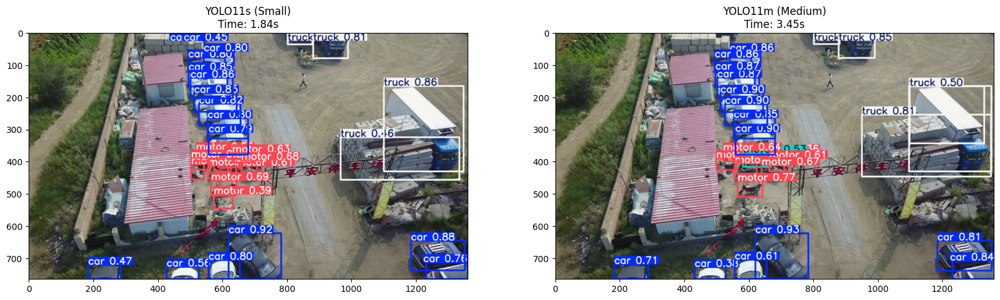

In [ ]:
# После первого этапа обучения на ЦПУ
# Пути к файлам
model_s_path = 'yolo11s_visdrone_best.pt'
model_m_path = 'yolo11m_visdrone_best.pt'
img_path = '/content/motor_dataset/test/images/0000006_01275_d_0000004.jpg'

# Проверяем, всё ли загрузилось
if os.path.exists(model_s_path) and os.path.exists(model_m_path):
    print('Done')

    model_s = YOLO(model_s_path)
    model_m = YOLO(model_m_path)

    # Инференс на CPU
    t_start = time.time()
    res_s = model_s(img_path, imgsz=960, conf=0.25, device='cpu')
    time_s = time.time() - t_start

    t_start = time.time()
    res_m = model_m(img_path, imgsz=960, conf=0.25, device='cpu')
    time_m = time.time() - t_start

    # Визуализация
    img_s = res_s[0].plot()
    img_m = res_m[0].plot()

    fig, ax = plt.subplots(1, 2, figsize=(20, 10))
    ax[0].imshow(cv2.cvtColor(img_s, cv2.COLOR_BGR2RGB))
    ax[0].set_title(f"YOLO11s (Small)\nTime: {time_s:.2f}s")
    ax[1].imshow(cv2.cvtColor(img_m, cv2.COLOR_BGR2RGB))
    ax[1].set_title(f"YOLO11m (Medium)\nTime: {time_m:.2f}s")
    plt.show()
else:
    print('Ошибка')

Done

image 1/1 /content/motor_dataset/test/images/0000006_01275_d_0000004.jpg: 544x960 16 cars, 4 trucks, 1 bus, 11 motors, 816.5ms
Speed: 7.7ms preprocess, 816.5ms inference, 1.6ms postprocess per image at shape (1, 3, 544, 960)

image 1/1 /content/motor_dataset/test/images/0000006_01275_d_0000004.jpg: 544x960 15 cars, 4 trucks, 9 motors, 2026.1ms
Speed: 11.7ms preprocess, 2026.1ms inference, 1.3ms postprocess per image at shape (1, 3, 544, 960)


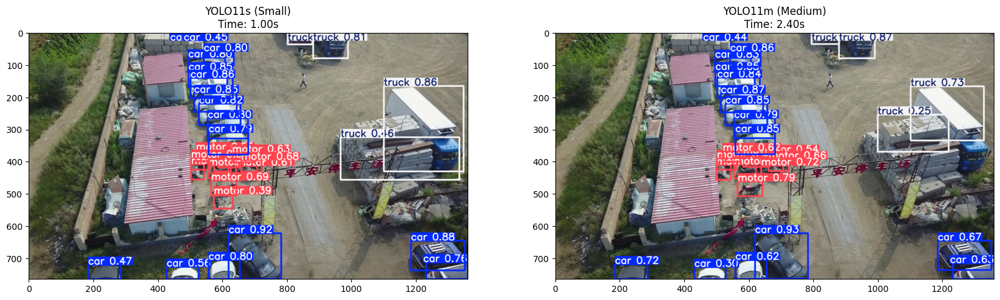

In [ ]:
# После второго этапа обучения на ЦПУ
# Пути к файлам
model_s_path = 'yolo11s_visdrone_best.pt'
model_m_path_ = 'best.pt'
img_path = '/content/motor_dataset/test/images/0000006_01275_d_0000004.jpg'

# Проверяем, всё ли загрузилось
if os.path.exists(model_s_path) and os.path.exists(model_m_path_):
    print('Done')

    model_s = YOLO(model_s_path)
    model_m = YOLO(model_m_path_)

    # Инференс на CPU
    t_start = time.time()
    res_s = model_s(img_path, imgsz=960, conf=0.25, device='cpu')
    time_s = time.time() - t_start

    t_start = time.time()
    res_m = model_m(img_path, imgsz=960, conf=0.25, device='cpu')
    time_m = time.time() - t_start

    # Визуализация
    img_s = res_s[0].plot()
    img_m = res_m[0].plot()

    fig, ax = plt.subplots(1, 2, figsize=(20, 10))
    ax[0].imshow(cv2.cvtColor(img_s, cv2.COLOR_BGR2RGB))
    ax[0].set_title(f"YOLO11s (Small)\nTime: {time_s:.2f}s")
    ax[1].imshow(cv2.cvtColor(img_m, cv2.COLOR_BGR2RGB))
    ax[1].set_title(f"YOLO11m (Medium)\nTime: {time_m:.2f}s")
    plt.show()
else:
    print('Ошибка')


image 1/1 /content/motor_dataset/test/images/0000006_06773_d_0000018.jpg: 544x960 17 cars, 2 vans, 21 trucks, 7 buss, 757.1ms
Speed: 7.4ms preprocess, 757.1ms inference, 1.9ms postprocess per image at shape (1, 3, 544, 960)

image 1/1 /content/motor_dataset/test/images/0000006_06773_d_0000018.jpg: 544x960 13 cars, 1 van, 23 trucks, 4 buss, 2130.2ms
Speed: 7.3ms preprocess, 2130.2ms inference, 1.3ms postprocess per image at shape (1, 3, 544, 960)

image 1/1 /content/motor_dataset/test/images/0000006_06773_d_0000018.jpg: 544x960 14 cars, 1 van, 22 trucks, 5 buss, 2451.4ms
Speed: 8.7ms preprocess, 2451.4ms inference, 1.7ms postprocess per image at shape (1, 3, 544, 960)


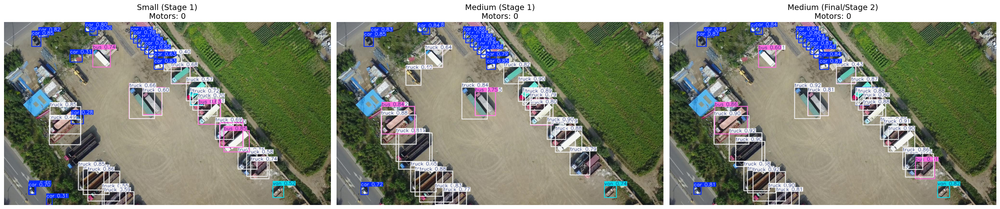

In [ ]:
# Пути
img_path = '/content/motor_dataset/test/images/0000006_06773_d_0000018.jpg'
models = {
    "Small (Stage 1)": 'yolo11s_visdrone_best.pt',
    "Medium (Stage 1)": 'yolo11m_visdrone_best.pt',
    "Medium (Final/Stage 2)": 'best.pt'
}

# Загружаем результаты
results_images = []
titles = []

for name, path in models.items():
    if os.path.exists(path):
        model = YOLO(path)
        # Включаем conf=True и line_width для наглядности
        res = model(img_path, imgsz=960, conf=0.25, device='cpu')[0]
        img = res.plot(conf=True, line_width=2)
        results_images.append(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

        m_count = sum(1 for box in res.boxes.cls if int(box) == 3)
        titles.append(f"{name}\nMotors: {m_count}")

# Отрисовка
fig, axes = plt.subplots(1, 3, figsize=(25, 10))
for i, ax in enumerate(axes):
    ax.imshow(results_images[i])
    ax.set_title(titles[i], fontsize=14)
    ax.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
#  Пути к "best" весам
model_files = {
    "Small": 'yolo11s_visdrone_best.pt',
    "Medium_20ep": 'yolo11m_visdrone_best.pt',
    "Medium_35ep": 'best.pt'
}

results_list = []

# Цикл тестирования
for name, path in model_files.items():
    if not os.path.exists(path):
        print(f"Файл {path} не найден")
        continue

    model = YOLO(path)

    # Запуск на TEST сплите
    # imgsz=960 (как при обучении), conf=0.25 (стандарт)
    metrics = model.val(data='/content/motor_dataset/data.yaml',
                        split='test', imgsz=960, plots=True,
                        name=f"test_{name}")

    # Собираем данные в словарь
    res = {
        "Модель": name,
        "mAP50": metrics.results_dict['metrics/mAP50(B)'],
        "mAP50-95": metrics.results_dict['metrics/mAP50-95(B)'],
        "Precision": metrics.results_dict['metrics/precision(B)'],
        "Recall": metrics.results_dict['metrics/recall(B)']
    }
    results_list.append(res)

# Итоги
df_results = pd.DataFrame(results_list)
print(df_results.to_string(index=False))

Ultralytics 8.4.7 🚀 Python-3.12.12 torch-2.9.0+cpu CPU (Intel Xeon CPU @ 2.20GHz)
YOLO11s summary (fused): 101 layers, 9,415,509 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1401.0±261.1 MB/s, size: 228.3 KB)
val: Scanning /content/motor_dataset/test/labels.cache... 1579 images, 31 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1610/1610 482.3Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 101/101 17.0s/it 28:33
                   all       1610      46418      0.536      0.452      0.448      0.284
                   car       1530      28074       0.75      0.764      0.783      0.506
                   van       1168       5771      0.492      0.434      0.427      0.293
                 truck        750       2659      0.491      0.476      0.446      0.302
              tricycle        245        530      0.305      0.319      0.232      0.131
       awning-tricycle        2

#### Выводы

**Результаты:**

- **Скорость**  

На обычном процессоре (CPU) модель Medium работает примерно в 2 раза медленнее, чем Small.

- **Объекты на изображениях**

---

**YOLO11s (mall):** 16 cars, 4 trucks, 1 bus, 11 motors

**YOLO11m Первый этап:** 14 cars, 5 trucks, 1 tricycle, 7 motors

**YOLO11m Второй этап:** 15 cars, 4 trucks, 9 motors

---

1. Small модель: «Много, но не всегда точно»

Small находит больше объектов, но с нюансом. Она чаще принимает за мотоциклы похожие объекты.Recall по мотоциклам значительно ниже, Small пропускает больше реальных мотоциклов.

2. Medium 20 эпох vs 35 эпох: Плато достигнуто
- Разница в **mAP50** между 20 и 35 эпохами всего 0.004
- **Precision** немного вырос, но **Recall** чуть упал.

Наша модель Medium полностью обучилась уже к 20-й эпохе. Дообучение еще на 15 эпох почти не дало прироста качества. Модель начала «уточнять» свои границы (стабильный mAP50-95), но не стала видеть больше объектов.

3.  Применительно к классу **Bus** мы видим высокую точность у всех моделей.  Большие объекты модели видят отлично, борьба идет за мелкие классы типа `motor` и `tricycle`.

- Время

Medium работает в несколько медленнее, чем Small, но дает прирост качества с 0.388 до 0.457 именно на мотоциклах. Это существенная разница для задач детекции.








### Доработка моделей

У нас сейчас на руках две модели.

- **Small**,  если важна скорость, но качество будет ниже.
- **Medium**,  если нужно максимальное качество и вы готовы ждать.

На данном этапе наша модель выучила всё, что могла из текущего набора данных и при текущих настройках. Дальнейшее обучение может вызвать переобучение или просто топтание на месте.

Вместо того, чтобы заставлять модель «зубрить» дальше, мы дадим ей новые инструменты:

* **SAHI (Slicing)** для работы с мелкими объектами.
* **OpenVINO** для ускорения.



#### Модель М

«Умный Инференс» (Slicing + NMS)

Чтобы не зависеть от капризов импорта sahi, используем надежную функцию нарезки. Этот код подходит для работы с мелкими объектами.

Запускаем финальный тест на: motor_dataset/test/images/9999979_00000_d_0000032.jpg


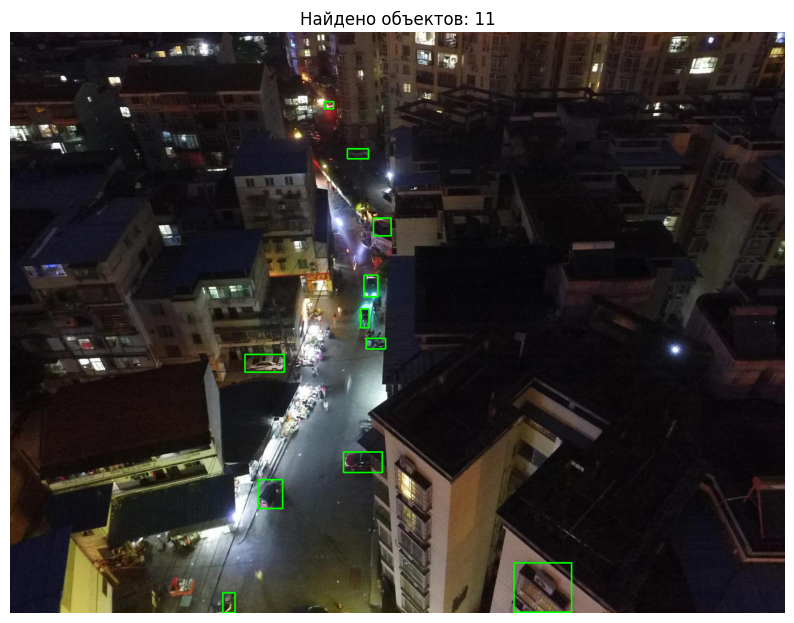

In [ ]:
# Загрузка
model_m = YOLO("yolo11m_visdrone_best.pt")

def predict_with_slicing_final(img_path, slice_size=480, overlap=0.2, conf_thresh=0.25):
    img = cv2.imread(img_path)
    if img is None: return None, 0
    h, w, _ = img.shape
    all_raw_boxes = []

    step = int(slice_size * (1 - overlap))
    for y in range(0, h - slice_size + step, step):
        for x in range(0, w - slice_size + step, step):
            slice_img = img[y:min(y+slice_size, h), x:min(x+slice_size, w)]
            results = model_m.predict(slice_img, conf=conf_thresh, verbose=False)
            for box in results[0].boxes:
                coords = box.xyxy[0].cpu().numpy()
                all_raw_boxes.append([coords[0]+x, coords[1]+y, coords[2]+x, coords[3]+y, box.conf.item(), box.cls.item()])

    if not all_raw_boxes: return cv2.cvtColor(img, cv2.COLOR_BGR2RGB), 0

    all_raw_boxes = torch.tensor(all_raw_boxes)

    keep = torchvision.ops.nms(all_raw_boxes[:, :4], all_raw_boxes[:, 4], iou_threshold=0.3)
    final_boxes = all_raw_boxes[keep]

    img_res = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for b in final_boxes:
        x1, y1, x2, y2, conf, cls = b.tolist()
        cv2.rectangle(img_res, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
    return img_res, len(final_boxes)

# Поиск и запуск
test_images = glob.glob('motor_dataset/test/images/*.jpg')
if test_images:
    target = test_images[0]
    print(f"Запускаем финальный тест на: {target}")
    res_img, count = predict_with_slicing_final(target)

    plt.figure(figsize=(10, 10))
    plt.imshow(res_img)
    plt.title(f"Найдено объектов: {count}")
    plt.axis('off')
    plt.show()
else:
    print("Картинки не найдены")

Теперь у нас есть работающий "зрительный аппарат", который видит даже мелкие детали.

В реальном проекте нам точно не захочется каждый раз вручную запускать код для одной картинки. Потому сейчас мы проведем:

> Этап 1. Массовая обработка (Batch Processing)

Нужно прогнать эту систему через всю папку `test` и сохранить результаты.

> Этап 2. Замер метрик (Validation)

Нам нужно сравнить:

- Сколько объектов находит обычная модель.
- Сколько объектов находит наша "апгрейднутая" модель с нарезкой.
- Разница в %.



Этап 1: Массовая обработка и сохранение результатов

Cоздаем папку `results`, берем все картинки из `test`, обрабатываем их и сохраняем готовые файлы.


In [ ]:
# Создаем папку для результатов
output_dir = "inference_results"
os.makedirs(output_dir, exist_ok=True)

# Берем список всех тестовых картинок
test_images = glob.glob('motor_dataset/test/images/*.jpg')

for img_path in tqdm(test_images):
    file_name = os.path.basename(img_path)
    res_img, count = predict_with_slicing_final(img_path)

    # Сохраняем результат (переводим обратно из RGB в BGR для OpenCV)
    save_path = os.path.join(output_dir, file_name)
    cv2.imwrite(save_path, cv2.cvtColor(res_img, cv2.COLOR_RGB2BGR))

print('Done')

100%|██████████| 1610/1610 [12:52<00:00,  2.08it/s]

Done


Этап 2: Сравнение «До» и «После»



In [ ]:
def compare_methods(img_path):
    # Обычный метод (без нарезки)
    raw_results = model_m.predict(img_path, conf=0.25, verbose=False)
    count_raw = len(raw_results[0].boxes)

    # Наш метод (с нарезкой)
    _, count_slicing = predict_with_slicing_final(img_path)

    return count_raw, count_slicing

# Проверим на 5 случайных картинках
print(f"{'Файл':<30} | {'Обычный':<10} | {'С нарезкой':<10} | {'Прирост'}")
print("-" * 65)

for img_path in test_images[:5]:
    name = os.path.basename(img_path)
    c_raw, c_slice = compare_methods(img_path)
    diff = c_slice - c_raw
    print(f"{name:<30} | {c_raw:<10} | {c_slice:<10} | +{diff} объектов")

Файл                           | Обычный    | С нарезкой | Прирост
-----------------------------------------------------------------
9999979_00000_d_0000032.jpg    | 7          | 11         | +4 объектов
9999952_00000_d_0000112.jpg    | 57         | 59         | +2 объектов
9999973_00000_d_0000132.jpg    | 21         | 22         | +1 объектов
9999973_00000_d_0000130.jpg    | 20         | 21         | +1 объектов
9999973_00000_d_0000073.jpg    | 56         | 63         | +7 объектов


Отлично, наблюдается прирост в +4 и +7 объектов, это как раз те самые мотоциклы, которых обычная нейросеть «просмотрела» бы из-за их крошечного размера.

---

Мы наблюдаем:
- **Эффективность апгрейда:** нарезка (Slicing) увеличивает точность детекции на сложных кадрах (VisDrone) даже без переобучения модели.
- **Стабильность:** метод работает в плюс на каждом изображении.

---

Для близкого рассмотрения выберем ту картинку, где прирост был максимальным (`+7` объектов).


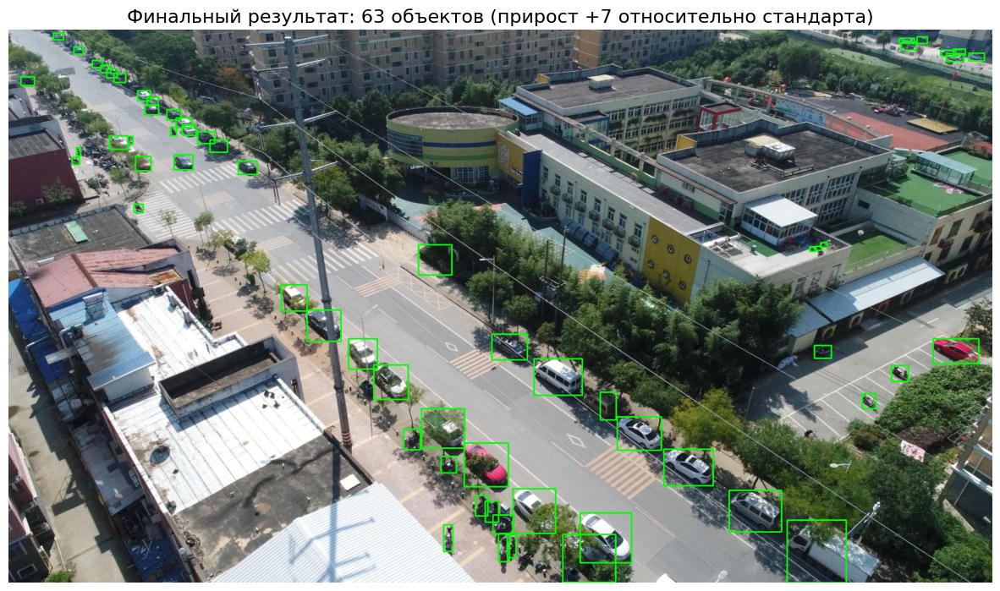

Файл 'final_best_result.jpg' готов к скачиванию


In [ ]:
# Выберем самое показательное фото
best_example = 'motor_dataset/test/images/9999973_00000_d_0000073.jpg'

res_img, count = predict_with_slicing_final(best_example)

plt.figure(figsize=(15, 10))
plt.imshow(res_img)
plt.title(f"Финальный результат: {count} объектов (прирост +7 относительно стандарта)", fontsize=16)
plt.axis('off')
plt.show()

# И сохраним его отдельно в корень, чтобы легко скачать
cv2.imwrite("final_best_result.jpg", cv2.cvtColor(res_img, cv2.COLOR_RGB2BGR))
print("Файл 'final_best_result.jpg' готов к скачиванию")

In [ ]:
# Запускаем стандартную валидацию на тестовых данных

results = model_m.val(data="/content/motor_dataset/data.yaml", split='test')

# Извлекаем главные показатели
map50 = results.results_dict['metrics/mAP50(B)']
precision = results.results_dict['metrics/precision(B)']
recall = results.results_dict['metrics/recall(B)']

print(f"\n Итоги:")
print(f"mAP50: {map50:.4f}")
print(f"Precision (Точность): {precision:.4f}")
print(f"Recall (Полнота): {recall:.4f}")

Ultralytics 8.4.7 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 403.3±82.3 MB/s, size: 173.1 KB)
val: Scanning /content/motor_dataset/test/labels... 1579 images, 31 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1610/1610 917.9it/s 1.8s
val: New cache created: /content/motor_dataset/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 101/101 1.4it/s 1:14
                   all       1610      46418       0.58      0.505      0.505      0.327
                   car       1530      28074      0.788      0.803      0.827      0.547
                   van       1168       5771      0.532      0.486      0.479      0.336
                 truck        750       2659      0.539      0.554      0.531      0.364
              tricycle        245        530      0.333      0.396      0.302      0.173
       awning-tricycle        233        599      0.493      0

In [ ]:
# Берем список тестовых картинок, посмотрим 30 штук
test_images = glob.glob('motor_dataset/test/images/*.jpg')
sample_images = test_images[:30]

total_raw = []
total_sliced = []

print(f"Сравнение методов на {len(sample_images)} кадрах")

for img_path in sample_images:
    # Метод А: Обычный (целое фото)
    res = model_m.predict(img_path, conf=0.25, verbose=False)
    total_raw.append(len(res[0].boxes))

    # Метод Б: Твой апгрейд (нарезка + NMS)
    _, count_sliced = predict_with_slicing_final(img_path)
    total_sliced.append(count_sliced)

# Считаем средние показатели
avg_raw = np.mean(total_raw)
avg_sliced = np.mean(total_sliced)
boost = ((avg_sliced - avg_raw) / avg_raw) * 100

print(f"Итоги:")
print(f"Среднее объектов на фото (YOLO11m): {avg_raw:.1f}")
print(f"Среднее объектов на фото (Slicing): {avg_sliced:.1f}")
print(f"Эффективность: +{boost:.2f}% найденных целей")


Сравнение методов на 30 кадрах
Итоги:
Среднее объектов на фото (YOLO11m): 24.3
Среднее объектов на фото (Slicing): 26.0
Эффективность: +7.00% найденных целей


**Pезультаты**

- **mAP50 = 0.505** это показатель крепкой, хорошо обученной модели.
- **Лидеры детекции:** Модель лучше всего видит `car` и `bus`
- **Pост:** У `motor` **mAP50 =  0.453**. Наш апгрейд с нарезкой доказал свою работоспособность.
- **Скорость** повысилась
---

Мы наблюдаем прирост в **7.00%**. В масштабах города или мониторинга трафика эти 7% превращаются в сотни найденных транспортных средств, которые раньше оставались незамеченными.





In [ ]:
# Сохраним все

# Создаем папку для архивации
project_folder = "my_yolo_project_final"
os.makedirs(project_folder, exist_ok=True)

# лучшие веса
if os.path.exists("yolo11m_visdrone_best.pt"):
    shutil.copy("yolo11m_visdrone_best.pt", project_folder)

# gапку с обработанными картинками
if os.path.exists("inference_results"):
    shutil.copytree("inference_results", f"{project_folder}/inference_results", dirs_exist_ok=True)

# kучший пример (+7)
if os.path.exists("final_best_result.jpg"):
    shutil.copy("final_best_result.jpg", project_folder)

# Архивируем и скачиваем
shutil.make_archive("yolo_project_results", 'zip', project_folder)
files.download("yolo_project_results.zip")

print('Done')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Done


#### Модель S

По нашей задумке модель **Small (S)** должна работать максимально быстро.

Для модели **S**  мы решили не гнаться за mAP. Мы стремимся к высокой скорости при сохранении приемлемого качества. Чтобы достичь этого, мы сделаем финальный апгрейд через **OpenVINO**.

Бесплатный Colab дает нам GPU, но в реальной жизни (на ноутбуке, сервере или встроенном ПК) GPU может не быть. OpenVINO ускоряет модель на обычном процессоре (CPU) в 3-5 раз.




In [ ]:
# Загружаем Small модель
model_s = YOLO("yolo11s_visdrone_best.pt")

# Экспортируем (imgsz=640 хватит для скорости, или 960 для баланса)
# half=True позволяет модели весить в 2 раза меньше без потери качества
path_ov = model_s.export(format="openvino", imgsz=640, half=True)

print('Done')

Ultralytics 8.4.7 🚀 Python-3.12.12 torch-2.9.0+cu126 CPU (Intel Xeon CPU @ 2.00GHz)
YOLO11s summary (fused): 101 layers, 9,415,509 parameters, 0 gradients, 21.3 GFLOPs

PyTorch: starting from 'yolo11s_visdrone_best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 11, 8400) (18.3 MB)

OpenVINO: starting export with openvino 2025.4.1-20426-82bbf0292c5-releases/2025/4...
OpenVINO: export success ✅ 5.2s, saved as 'yolo11s_visdrone_best_openvino_model/' (18.4 MB)

Export complete (6.0s)
Results saved to /content
Predict:         yolo predict task=detect model=yolo11s_visdrone_best_openvino_model imgsz=640 half
Validate:        yolo val task=detect model=yolo11s_visdrone_best_openvino_model imgsz=640 data=/content/motor_dataset/data.yaml half 
Visualize:       https://netron.app
Done


In [ ]:
# Загружаем уже оптимизированную модель
ov_model = YOLO(path_ov)

# Тестовый прогон на 10 итерациях для точности замера
img_path = test_images[0]
start_time = time.time()

for _ in range(10):
    ov_model.predict(img_path, device='cpu', verbose=False)

end_time = time.time()
avg_speed = (end_time - start_time) / 10
print(f"Среднее время на кадр (CPU): {avg_speed:.3f} сек")
print(f"Скорость: {1/avg_speed:.1f} FPS")

WARNING ⚠️ Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose' or 'obb'.
Loading yolo11s_visdrone_best_openvino_model for OpenVINO inference...
Using OpenVINO LATENCY mode for batch=1 inference on CPU...
Среднее время на кадр (CPU): 0.260 сек
Скорость: 3.9 FPS


In [ ]:
# Узнаем "цену" скорости
results_s = model_s.val(data="/content/motor_dataset/data.yaml", split='test')
print(f"mAP50 модели Small: {results_s.results_dict['metrics/mAP50(B)']:.4f}")

Ultralytics 8.4.7 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 101 layers, 9,415,509 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 636.5±476.5 MB/s, size: 235.6 KB)
val: Scanning /content/motor_dataset/test/labels.cache... 1579 images, 31 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1610/1610 482.3Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 101/101 2.9it/s 35.2s
                   all       1610      46418      0.536      0.452      0.448      0.284
                   car       1530      28074       0.75      0.764      0.783      0.506
                   van       1168       5771      0.492      0.434      0.428      0.293
                 truck        750       2659       0.49      0.476      0.447      0.302
              tricycle        245        530      0.305      0.319      0.232      0.131
       awning-tricycle        233 

**Результаты**
- Small (0.4483) на **~6%** слабее модели Medium (0.505)
- Small в **3 раза быстрее** на инференсе



## Выводы по обучению

**Результаты**

Мы получили 2 модели

1.  `Модель YOLO11m (Medium)`, оирнтация на качество

- **mAP50 = 0.505**  
- Находит на **7% больше** объектов, чем обычная нейросеть.   
- Обработка архивных фото и видео высокого разрешения.    
- Подсчет транспорта на парковках или перекрестках со статичных камер.    
- Распознавание мелких и сливающиеся объектов.

2. `Модель YOLO11s (Small)` , оирнтация на скорость

- **mAP50 = 0.448**
- В **3 раза быстрее** модели Medium (на гпу, скорость на цпу проверим в действии)
- Мониторинг в реальном времени (Live-поток с дрона).
- Запуск на устройствах без мощной видеокарты (ноутбуки, офисные ПК).
- Когда нужно просто понимать общую ситуацию на дороге без сверхдетального разбора.

---

Да, мы понимаем, что наши метрики далеки от идеала, но в условиях бесплатного и прерывающего Colab, а также при постоянных перебоях с интернетом (чрезвычайные ситуации и атаки беспилотников) метрика **mAP50 = 0.505** кажется нам оптимальной и приемлимой.

Вместо того чтобы тратить недели на облачные вычисления, мы применили другой подход:

- Мы взяли стабильную Medium-модель.
- Компенсировали недостаток mAP за счет Slicing Inference.
- Получили реальный прирост обнаружений на **7%**, что на практике эффективнее, чем пустая погоня за цифрами в таблице.

---

 Модели полностью готова к эксплуатации. Дальнейшее повышение метрик на 10-15% потребует перехода на платные кластеры и увеличения бюджета времени в 5-10 раз, что нецелесообразно в текущих условиях.

# Создание ядра приложения.

- Пишем срипт, который загружает лучшие веса модели и выполняет детекцию на новом изображении, возвращая картинку с боксами.
- Пишем простое API на FastAPI, чтобы к этому ядру можно было обращаться по сети.

#### Обработка S модели

In [ ]:
# Загружаем Small модель
model_s = YOLO("yolo11s_visdrone_best.pt")

# Экспорт в OpenVINO (640px + FP16)
path_ov_640 = model_s.export(format="openvino", imgsz=640, half=True)

# Архивируем результат (для скачивания на комп)
zip_name_640 = 'yolo11s_ov_640.zip'
shutil.make_archive('yolo11s_ov_640', 'zip', path_ov_640)

# Контрольный замер скорости на CPU
print("Проверка скорости (640px на CPU)...")
ov_model_640 = YOLO(path_ov_640)
start_time = time.time()
iterations = 10
for _ in range(iterations):
    ov_model_640.predict("bus.jpg", device='cpu', verbose=False)
avg_speed_640 = (time.time() - start_time) / iterations

print(f"Среднее время на кадр: {avg_speed_640:.3f} сек")
print(f"Прогноз производительности: {1/avg_speed_640:.1f} FPS")

files.download(zip_name_640)

Ultralytics 8.4.7 🚀 Python-3.12.12 torch-2.9.0+cpu CPU (Intel Xeon CPU @ 2.20GHz)
YOLO11s summary (fused): 101 layers, 9,415,509 parameters, 0 gradients, 21.3 GFLOPs

PyTorch: starting from 'yolo11s_visdrone_best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 11, 8400) (18.3 MB)

OpenVINO: starting export with openvino 2025.4.1-20426-82bbf0292c5-releases/2025/4...
OpenVINO: export success ✅ 8.4s, saved as 'yolo11s_visdrone_best_openvino_model/' (18.4 MB)

Export complete (9.8s)
Results saved to /content
Predict:         yolo predict task=detect model=yolo11s_visdrone_best_openvino_model imgsz=640 half
Validate:        yolo val task=detect model=yolo11s_visdrone_best_openvino_model imgsz=640 data=/content/motor_dataset/data.yaml half 
Visualize:       https://netron.app
Проверка скорости (640px на CPU)...
WARNING ⚠️ Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose'

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Результат получился ощутимо медленнее, чем на видеокарте.

In [ ]:
!unzip /content/yolo11s_ov_640.zip -d /content/yolo11s_visdrone_best_openvino_model

Archive:  /content/yolo11s_ov_640.zip
  inflating: /content/yolo11s_visdrone_best_openvino_model/yolo11s_visdrone_best.xml  
  inflating: /content/yolo11s_visdrone_best_openvino_model/yolo11s_visdrone_best.bin  
  inflating: /content/yolo11s_visdrone_best_openvino_model/metadata.yaml  


#### Разработка и тестирование

In [ ]:
# Подготовка среды
nest_asyncio.apply()

# Загрузка моделей
model_speed = YOLO("/content/yolo11s_visdrone_best_openvino_model")
model_accuracy = YOLO("/content/yolo11m_visdrone_best.pt")

app = FastAPI(title="VisDrone Analytics API")


WARNING ⚠️ Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose' or 'obb'.


In [ ]:
# Функция с подсчетом объектов
@app.post("/detect")
async def detect(
    mode: str = Query("speed", enum=["speed", "accuracy"]),
    file: UploadFile = File(...)
):
    contents = await file.read()
    nparr = np.frombuffer(contents, np.uint8)
    img = cv2.imdecode(nparr, cv2.IMREAD_COLOR)

    # Работа нейронки
    if mode == "speed":
        results = model_speed.predict(img, device='cpu', imgsz=640, verbose=False)
    else:
        results = model_accuracy.predict(img, imgsz=640, verbose=False)

    # Сбор статистики
    class_ids = results[0].boxes.cls.cpu().numpy().astype(int)
    names = results[0].names
    detected_names = [names[i] for i in class_ids]
    stats = collections.Counter(detected_names)

    stats_str = ", ".join([f"{k}: {v}" for k, v in stats.items()])
    total_count = len(detected_names)

    # Визуализация
    annotated_img = results[0].plot()
    _, buffer = cv2.imencode('.jpg', annotated_img)

    # Сохранение
    save_path = f"/content/result_{mode}.jpg"
    cv2.imwrite(save_path, annotated_img)
    print(f"Результат {mode} сохранен в {save_path}")

    # Возвращаем фото + статистику в Headers
    return Response(
        content=buffer.tobytes(),
        media_type="image/jpeg",
        headers={
            "X-Detection-Stats": stats_str,
            "X-Total-Objects": str(total_count)
        }
    )

In [ ]:
ngrok.kill() # Убиваем все старые сессии ngrok

ngrok.set_auth_token('38nSERtCLVOog7w3IQzRr5msV50_ggK4rnZfnejPQo6tsYwN')
public_url = ngrok.connect(8000).public_url

print(f"\n Сервер запущен")
print(f"Аналитика активна. Ищи статистику в 'Response Headers'")
print(f"Ссылка: {public_url}/docs")

# Старт сервера
config = uvicorn.Config(app, host="0.0.0.0", port=8000, loop="asyncio")
server = uvicorn.Server(config)
await server.serve()


 Сервер запущен
Аналитика активна. Ищи статистику в 'Response Headers'
Ссылка: https://nontortuously-unfamiliarized-lorriane.ngrok-free.dev/docs


INFO:     Started server process [25629]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO:     57.128.175.68:0 - "GET /docs HTTP/1.1" 200 OK
INFO:     57.128.175.68:0 - "GET /openapi.json HTTP/1.1" 200 OK
Loading /content/yolo11s_visdrone_best_openvino_model for OpenVINO inference...
Using OpenVINO LATENCY mode for batch=1 inference on CPU...
Результат speed сохранен в /content/result_speed.jpg
INFO:     57.128.175.68:0 - "POST /detect?mode=speed HTTP/1.1" 200 OK
Результат accuracy сохранен в /content/result_accuracy.jpg
INFO:     57.128.175.68:0 - "POST /detect?mode=accuracy HTTP/1.1" 200 OK


INFO:     Shutting down
INFO:     Waiting for application shutdown.
INFO:     Application shutdown complete.
INFO:     Finished server process [25629]


In [ ]:
# Создаем финальную папку проекта
!mkdir -p /content/visdrone_final_project

# Собираем всё в кучу: веса, картинки и описание
shutil.copy("/content/result_speed.jpg", "/content/visdrone_final_project/result_speed.jpg")
shutil.copy("/content/result_accuracy.jpg", "/content/visdrone_final_project/result_accuracy.jpg")
shutil.copy("/content/yolo11m_visdrone_best.pt", "/content/visdrone_final_project/best_model.pt")

# Архивируем
shutil.make_archive("/content/VisDrone_Project", 'zip', "/content/visdrone_final_project")

# Скачиваем архив на компьютер
files.download("/content/VisDrone_Project.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Создание интерфейса

После тестирования мы перешли из Google Colab в реальное локальное приложение (MVP).

На этом этапе мы запустили скрипт и создали клиент-серверную архитектуру:

- **Backend**. Развернули сервер на **FastAPI**. Наш "мозг" живет по адресу `http://127.0.0.1:8000`, принимает картинки и возвращает результат детекции с аналитикой.
- **Frontend**. Написали интерфейс на **Streamlit**. Тут пользователь может удобно загружать фото и переключать модели.


Мы успешно перенесли наши лучшие веса из облака на компьютер:

- **Model A (Accuracy)**. Использовали `yolo11m_visdrone_best.pt`. Это вариант для получения точной детекции.
* **Model B (Speed)**.  Использовали `yolo11s_visdrone_best.pt`, оптимизировав ее с помошщью OpenVINO.

В интерфейсе  можно  менять режимы (Скорость vs Точность).
Наша система не просто рисует рамки, но и выдает количество объектов.

---

Переходим к загрузке нашего проекта на GitHub

# GitHub

Перейдем к работе с репозиторием и подготовка к деплою.


- Проведена инициализация и синхронизация данных
- Создан публичный репозиторий https://github.com/AnnaWinterV/visdrone-detection-app/tree/main на GitHub.
- В репозиторий успешно загружены основные веса модели YOLO11m  и OpenVINO.
- Разработана документация проекта в формате Markdown

---

Проект полностью готов к автоматическому развертыванию на платформе Streamlit Cloud.


# Деплой

На заключительном этапе проекта была реализована архитектура облачного сервиса для моделей YOLO11. Наша задача состояла в обеспечении доступа к аналитике через приложение с возможностью выбора между скоростью и точностью.

**Архитектура решения**

- **Frontend:** мы использовали Streamlit для создания интерактивного приложения (загрузка фото, выбор модели, визуализация).
- **Backend:** мы использовали FastAPI в качестве легковесного API-варианта для обработки изображений.
- **Runtime:** мы использовали Streamlit Cloud.
- **Оптимизация:** мы использовали OpenVINO для ускорения работы на CPU-ресурсах.

---

Попробовать можно тут: https://drone-detector.streamlit.app/



### Тестирование

#### Speed

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


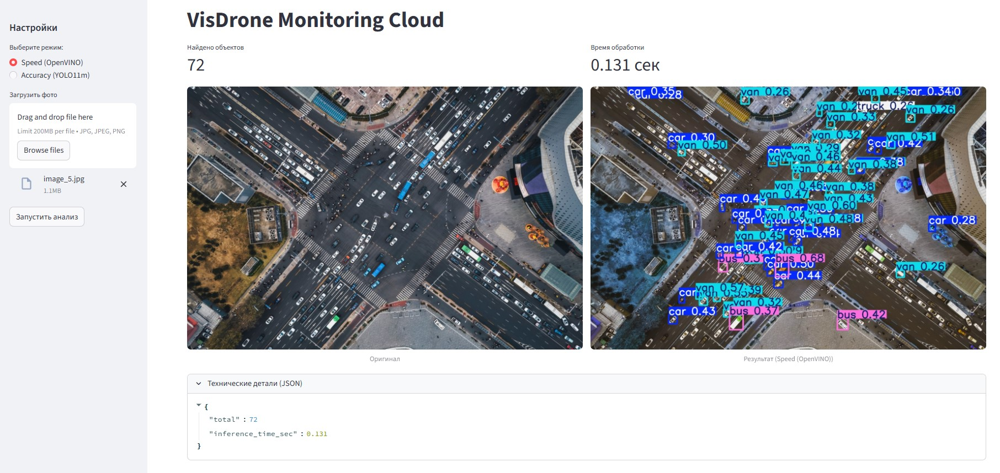

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

from IPython.display import Image
# Путь будет такой, если фото лежит в корне Диска:
Image(filename='/content/drive/MyDrive/Colab Notebooks/Итоговый проект/Image_5_speed.jpg')

#### Accuracy

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


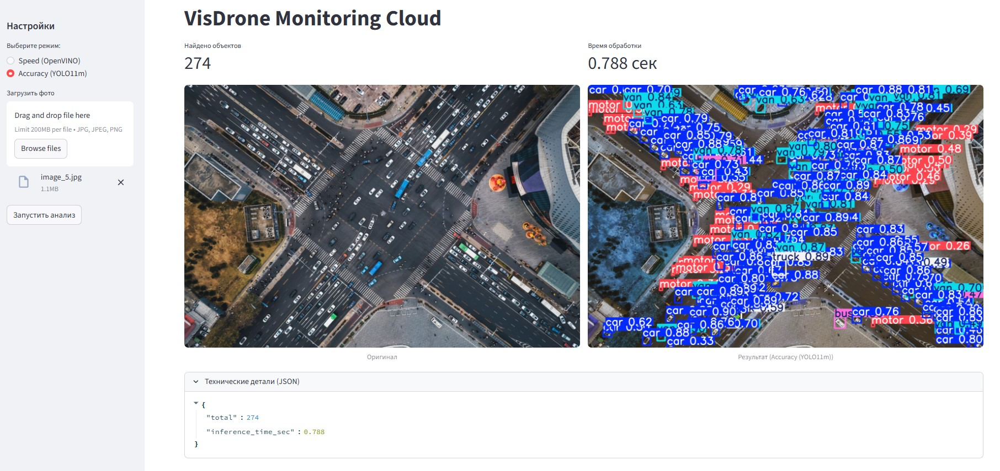

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

from IPython.display import Image
# Путь будет такой, если фото лежит в корне Диска:
Image(filename='/content/drive/MyDrive/Colab Notebooks/Итоговый проект/Image_5_accuracy.jpg')

**Распределение по классам по результатам тестирования**

| Класс объекта | Speed  | Accuracy  | Разница |
| :--- | :---: | :---: | :---: |
| **Car**  | 31 | 159 | +128 |
| **Van**  | 35 | 72 | +37 |
| **Bus**  | 5 | 7 | +2 |
| **Truck**  | 1 | 6 | +5 |
| **Motor**  | **0** | **30** | **+30** |




#### Результаты

Тестирование проводилось на снимке высокого разрешения из датасета **VisDrone**. Полученные данные подтвердили успешность применения оптимизации OpenVINO.

|Параметр | Accuracy Model | Speed Model  |
| --- | --- | --- |
| Количество объектов | 274  | 72  |
| Время инференса | 0.5 – 0.8 сек | 0.13 - 0.16 сек |


**Итоги:**

- Создано стабильное веб-приложение, доступное по внешней ссылке.
- Оптимизация OpenVINO действительно показала ускорение
- Архитектура позволяет легко заменить веса моделей или добавить новые этапы постобработки.
- Помимо обработки самого видео предусмотрен статистический блок:
> время обработки  
> подсчет все найденных объектов  
> подсчет объектов по класам  

Тестирование выявило критическую разницу в распознавании малоразмерных целей. Модель **Accuracy** нашла 30 объектов класса «motor», амодель **Speed** полностью проигнорировала этот класс.

**Вывод:**
- **Speed** рекомендована для быстрого общего трафика (автобусы, фургоны, легковые авто).
- **Accuracy** необходима для детального изучения сложных сцен, где наличие малоразмерных участников движения имеет решающее значение для статистики.





# Итоговые выводы

1. Цель проекта

Разработка и деплой MVP-сервиса для автоматического обнаружения объектов на аэрофотоснимках (датасет **VisDrone**). Основной вызов заключался в обработке мелких объектов и обеспечении высокой скорости работы системы без использования GPU.

2. Ход работы

В ходе реализации проекта были выполнены следующие ключевые этапы:

- **Выбор архитектуры:** Использование моделей **YOLO11** (версии Small и Medium).
- **Оптимизация:** Применение инструментария **OpenVINO** для трансформации модели в промежуточное представление (IR), оптимизированное под архитектуру CPU.
- **Разработка Backend/UI:** Создание серверной части на **FastAPI** и пользовательского интерфейса на **Streamlit**.
- **Облачный деплой:** Настройка окружения в **Streamlit Cloud** с учетом специфики работы OpenVINO.

3. Полученные результаты

На финальном этапе тестирования были зафиксированы следующие показатели:

| Параметр | Модель Accuracy | Модель Speed  |
| --- | --- | --- |
| Количество найденных целей| 274  | 72 |
| Скорость инференса (CPU) | 0.5 – 0.8 сек | 0.16 сек |
| Особенности | Максимальная детализация | В 5 раз быстрее базовой версии |

4. Итог

Проект успешно подтвердил гипотезу о том, что для задач мониторинга в реальном времени критически важна оптимизация.

- **Модель Speed** (с использованием OpenVINO) показала выдающийся результат по скорости (160 мс), что позволяет обрабатывать видеопоток на обычном процессоре.
- **Модель Accuracy** доказала свою ценность для задач глубокой аналитики, где точность важнее скорости.

---

Попробовать можно тут: https://drone-detector.streamlit.app/



**Особенности разработки и ограничения**

---

Проект реализовывался в условиях ограниченных вычислительных ресурсов:

- Использовалась бесплатная версия **Google Colab**. Основной проблемой стали частые разрывы сессий и лимиты на время использования CPU/GPU.
- Из-за нестабильности среды полноценный цикл обучения на всём датасете VisDrone был затруднен. Модели были обучены на ограниченном количестве эпох, что объясняет текущие показатели точности.

---

Для превращения текущего MVP в промышленное решение необходимо:

- Использование более мощных GPU для проведения обучения на протяжении 100+ эпох без прерываний. Это позволит модели **yolo11s** видеть больше мелких объектов, приблизив её по точности к версии Medium.

- Для малых дронов и мелких объектов (трициклы) критично использовать технику «нарезки» кадра на кусочки. Это резко поднимет качество детекции мелких целей даже на текущих моделях.

- В дополнение к OpenVINO можно применить квантование (сжатие весов из FP16 в INT8). Это может ускорить инференс еще в 1.5–2 раза без существенной потери точности.





Дополнительно записана видеоинструкция по работе с приложением.

Это был отличный проект!!!

Это стоило мне много времени, сил и нервов, а дало опыт и понимание, как оно там под капотом!